In [2]:

#读取dataset =  95%置信马氏距离_y1 dataset#5
#读取标准化参数 = scaler fit.transformer
#调用训练好的模型

In [3]:
# 导入必要的库
import pandas as pd
import numpy as np
import joblib
import time
from itertools import combinations
# 数据处理与划分
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# 模型
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.neural_network import MLPRegressor
import xgboost as xgb
import lightgbm as lgb
import catboost as cb

# 模型评估与选择
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# --- 1. 数据加载与准备 ---
# 假设您的数据已按如下方式加载和准备好
# 注意：请确保您已安装所有必需的库 (pandas, scikit-learn, xgboost, lightgbm, catboost, openpyxl)

file_path = 'E:/基于ML优化工艺参数/20250912_best_imputed_dataset_from_run_5.xlsx'
sheet_name = 'Sheet1'
data = pd.read_excel(file_path, sheet_name)


feature_names = ['T_t', 'T_b', 'Q_f', 'C_f', 'ΔT', 'P']
target_names = ['β']
data.columns = feature_names + target_names
print(f"成功读取数据，数据形状: {data.shape}")
print("数据前5行预览:")
print(data.head())

print("\n--- 划分数据集 ---")
TEST_SIZE = 0.2
SPLIT_RANDOM_STATE = 12
X = data[feature_names]
y = data[target_names]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=TEST_SIZE, random_state=SPLIT_RANDOM_STATE)
print(f"训练集形状: X-{X_train.shape}, y-{y_train.shape}")
print(f"测试集形状: X-{X_test.shape}, y-{y_test.shape}")
print("--- 数据集划分完成！ ---\n")


成功读取数据，数据形状: (93, 7)
数据前5行预览:
    T_t   T_b        Q_f        C_f    ΔT         P         β
0  70.9  45.4  10.614000   4.328428  25.5  5.072533  1.989670
1  66.7  43.0   9.570000   4.920000  23.7  5.010000  3.522358
2  67.8  40.2   6.264000  39.170000  27.6  4.000000  1.595098
3  67.1  44.2  10.637347   5.330000  22.9  5.000000  1.703565
4  53.3  31.7   7.560000   5.000000  21.6  3.990000  1.684000

--- 划分数据集 ---
训练集形状: X-(74, 6), y-(74, 1)
测试集形状: X-(19, 6), y-(19, 1)
--- 数据集划分完成！ ---



In [4]:


# --- 2. 数据标准化 (已修正) ---
print("\n--- 数据标准化 ---")
# 初始化缩放器
x_scaler = StandardScaler()
y_scaler = StandardScaler()

# 在训练集上拟合并转换，防止数据泄露
X_train_scaled = x_scaler.fit_transform(X_train)
y_train_scaled = y_scaler.fit_transform(y_train)

# 使用在训练集上学到的参数来转换测试集
X_test_scaled = x_scaler.transform(X_test)
# y_test_scaled = y_scaler.transform(y_test) # 在评估时我们会直接使用y_test，所以这一步不是必须的

print("数据标准化完成！")
print("注意: y_train 已被缩放以用于模型训练。评估指标将在原始尺度上计算。")


# --- 3. 定义九个基础预测模型及超参数网格 ---
models_and_params = {
    'Ridge': (Ridge(), {'alpha': [0.01, 0.1, 1.0, 10.0, 100.0]}),
    'DecisionTree': (DecisionTreeRegressor(random_state=SPLIT_RANDOM_STATE), {'max_depth': [3, 5, 7, None], 'min_samples_leaf': [1, 3, 5]}),
    'RandomForest': (RandomForestRegressor(random_state=SPLIT_RANDOM_STATE), {'n_estimators': [50, 100, 200], 'max_depth': [5, 10, None]}),
    'ExtraTrees': (ExtraTreesRegressor(random_state=SPLIT_RANDOM_STATE), {'n_estimators': [50, 100, 200], 'max_depth': [5, 10, None]}),
    'SVR': (SVR(), {'C': [0.1, 1, 10, 100], 'kernel': ['linear', 'rbf'], 'gamma': ['scale', 'auto']}),
    'XGBoost': (xgb.XGBRegressor(random_state=SPLIT_RANDOM_STATE), {'n_estimators': [50, 100, 200], 'learning_rate': [0.05, 0.1, 0.2], 'max_depth': [3, 5, 7]}),
    'LightGBM': (lgb.LGBMRegressor(random_state=SPLIT_RANDOM_STATE), {'n_estimators': [50, 100, 200], 'learning_rate': [0.05, 0.1, 0.2], 'num_leaves': [20, 31, 40]}),
    'CatBoost': (cb.CatBoostRegressor(random_state=SPLIT_RANDOM_STATE, verbose=0), {'iterations': [50, 100, 200], 'learning_rate': [0.05, 0.1, 0.2], 'depth': [4, 6, 8]}),
    'MLP': (MLPRegressor(random_state=SPLIT_RANDOM_STATE, max_iter=1000, early_stopping=True), {'hidden_layer_sizes': [(50,), (100,), (50, 50)], 'alpha': [0.0001, 0.001, 0.01]})
}

# --- 4. 训练、调优与评估循环 ---
print("\n--- 开始批量训练、调优和评估模型 ---")

best_model_name = ""
best_model_estimator = None
best_model_test_r2 = -float('inf')
model_performance_results = {}

# 遍历定义的每个模型
for model_name, (model, params) in models_and_params.items():
    print(f"\n{'='*20} 正在处理模型: {model_name} {'='*20}")
    start_time = time.time()

    # 配置网格搜索与交叉验证
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=params,
        cv=5,  # 五折交叉验证
        scoring='r2',  # 以R²为评估指标
        n_jobs=-1,  # 使用所有可用的CPU核心
        verbose=0   # 设置为1或更高以查看详细日志
    )

    # 在标准化后的训练数据上进行拟合
    # y_train_scaled.ravel() 将其从 (n_samples, 1) 转换为 (n_samples,) 以满足GridSearchCV的要求
    grid_search.fit(X_train_scaled, y_train_scaled.ravel())

    # 获取最佳模型
    best_estimator = grid_search.best_estimator_
    
    # --- 在训练集上评估性能 ---
    y_train_pred_scaled = best_estimator.predict(X_train_scaled)
    # 将预测结果反标准化，以计算原始尺度的指标
    y_train_pred_orig = y_scaler.inverse_transform(y_train_pred_scaled.reshape(-1, 1))
    
    train_r2 = r2_score(y_train, y_train_pred_orig)
    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred_orig))
    train_mae = mean_absolute_error(y_train, y_train_pred_orig)

    # --- 在测试集上评估性能 ---
    y_test_pred_scaled = best_estimator.predict(X_test_scaled)
    # 将预测结果反标准化
    y_test_pred_orig = y_scaler.inverse_transform(y_test_pred_scaled.reshape(-1, 1))

    test_r2 = r2_score(y_test, y_test_pred_orig)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred_orig))
    test_mae = mean_absolute_error(y_test, y_test_pred_orig)

    end_time = time.time()
    
    # 打印该模型的最终性能
    print(f"模型 '{model_name}' 训练调优完成，耗时: {end_time - start_time:.2f} 秒")
    print(f"找到的最佳超参数: {grid_search.best_params_}")
    print(f"训练集表现 -> R2: {train_r2:.4f}, RMSE: {train_rmse:.4f}, MAE: {train_mae:.4f}")
    print(f"测试集表现 -> R2: {test_r2:.4f}, RMSE: {test_rmse:.4f}, MAE: {test_mae:.4f}")

    # 存储结果
    model_performance_results[model_name] = {
        'train_r2': train_r2, 'train_rmse': train_rmse, 'train_mae': train_mae,
        'test_r2': test_r2, 'test_rmse': test_rmse, 'test_mae': test_mae
    }

    # 检查并更新全局最佳模型 (基于测试集R2)
    if test_r2 > best_model_test_r2:
        best_model_test_r2 = test_r2
        best_model_estimator = best_estimator
        best_model_name = model_name

# --- 5. 保存最佳模型 ---
print(f"\n{'='*25} 评估总结 {'='*25}")
print(f"所有模型已评估完毕。")
if best_model_estimator:
    print(f"在测试集上表现最佳的模型是: '{best_model_name}' (测试集 R² = {best_model_test_r2:.4f})")

    # 定义要保存的文件名
    model_filename = '0918best_model_for_beta_prediction.joblib'
    x_scaler_filename = 'x_scaler0918.joblib'
    y_scaler_filename = 'y_scaler0918.joblib'
    
    # 使用 joblib 保存模型和缩放器对象
    joblib.dump(best_model_estimator, model_filename)
    joblib.dump(x_scaler, x_scaler_filename)
    joblib.dump(y_scaler, y_scaler_filename)

    print(f"\n最佳模型已保存至: '{model_filename}'")
    print(f"特征缩放器 (x_scaler) 已保存至: '{x_scaler_filename}'")
    print(f"目标缩放器 (y_scaler) 已保存至: '{y_scaler_filename}'")
    print("您可以在后续任务中加载这些文件以进行新的预测。")
else:
    print("未能找到最佳模型，请检查训练过程。")


--- 数据标准化 ---
数据标准化完成！
注意: y_train 已被缩放以用于模型训练。评估指标将在原始尺度上计算。

--- 开始批量训练、调优和评估模型 ---

==================== 正在处理模型: Ridge ====================
模型 'Ridge' 训练调优完成，耗时: 1.58 秒
找到的最佳超参数: {'alpha': 1.0}
训练集表现 -> R2: 0.6995, RMSE: 0.4515, MAE: 0.3556
测试集表现 -> R2: 0.7945, RMSE: 0.3377, MAE: 0.2654

==================== 正在处理模型: DecisionTree ====================
模型 'DecisionTree' 训练调优完成，耗时: 0.10 秒
找到的最佳超参数: {'max_depth': 3, 'min_samples_leaf': 3}
训练集表现 -> R2: 0.8233, RMSE: 0.3462, MAE: 0.2434
测试集表现 -> R2: 0.8339, RMSE: 0.3036, MAE: 0.1772

==================== 正在处理模型: RandomForest ====================
模型 'RandomForest' 训练调优完成，耗时: 0.49 秒
找到的最佳超参数: {'max_depth': 5, 'n_estimators': 200}
训练集表现 -> R2: 0.9238, RMSE: 0.2273, MAE: 0.1627
测试集表现 -> R2: 0.9085, RMSE: 0.2254, MAE: 0.1429

==================== 正在处理模型: ExtraTrees ====================
模型 'ExtraTrees' 训练调优完成，耗时: 0.29 秒
找到的最佳超参数: {'max_depth': 5, 'n_estimators': 100}
训练集表现 -> R2: 0.9216, RMSE: 0.2306, MAE: 0.1561
测试集表现 -> R2: 0.8823, RMSE: 0.25

In [ ]:
# --- 3. 创建SHAP解释器并计算SHAP值 ---
# 对于SVR非树模型，使用 KernelExplainer
import shap
import matplotlib.pyplot as plt
# 加载模型和缩放器
try:
    best_model = joblib.load(model_filename)
    x_scaler = joblib.load(x_scaler_filename)
    print(f"成功加载模型 '{model_filename}' 和缩放器 '{x_scaler_filename}'！")
    print(f"加载的最佳模型类型为: {type(best_model).__name__}")
    # 确认加载的是SVR模型
    if 'SVR' not in str(type(best_model)):
        print(f"警告：加载的模型不是SVR，但本脚本已针对SVR进行优化。")
except FileNotFoundError:
    print(f"错误：找不到模型文件 '{model_filename}' 或缩放器文件 '{x_scaler_filename}'。")
    print("请确保您已经成功运行了上一步的模型训练与保存代码，并且文件位于当前工作目录下。")
    exit() # 如果文件不存在，则无法继续，退出程序

# 重新加载原始数据以确保一致性
try:
    file_path = 'E:/基于ML优化工艺参数/20250912_best_imputed_dataset_from_run_5.xlsx'
    sheet_name = 'Sheet1'
    data = pd.read_excel(file_path, sheet_name)
except FileNotFoundError:
    print("警告：未找到指定的原始数据文件。正在创建一个模拟DataFrame以供演示。")
    data = pd.DataFrame(np.random.rand(100, 7), 
                        columns=['T_t', 'T_b', 'Q_f', 'C_f', 'ΔT', 'P', 'β'])

feature_names = ['T_t', 'T_b', 'Q_f', 'C_f', 'ΔT', 'P']
target_names = ['β']
data.columns = feature_names + target_names
X = data[feature_names]
y = data[target_names]

# 为了创建SHAP KernelExplainer所需的“背景数据”，我们需要训练集
# 注意：这里的划分参数必须与模型训练时完全一致
SPLIT_RANDOM_STATE = 12
X_train, _, _, _ = train_test_split(X, y, test_size=0.2, random_state=SPLIT_RANDOM_STATE)

print(f"原始数据加载成功，总样本数: {X.shape[0]}")


# --- 2. 准备用于SHAP分析的数据 ---
# SHAP需要的数据格式应与模型训练时一致，即标准化后的数据
X_scaled = x_scaler.transform(X)
X_train_scaled = x_scaler.transform(X_train)

# 将numpy数组转为pandas DataFrame，以便SHAP绘图时能正确显示特征名
X_scaled_df = pd.DataFrame(X_scaled, columns=feature_names)
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=feature_names)


# --- 3. 创建SHAP解释器并计算SHAP值 (专门针对SVR模型) ---
# 由于您选择的模型是SVR，它是一种基于核方法的非树模型，我们使用 shap.KernelExplainer 来进行解释。
print("\n--- 为SVR模型初始化SHAP KernelExplainer ---")

# KernelExplainer 需要一个“背景数据集”来近似计算期望值（模型的平均预测输出）。
# 我们使用shap.kmeans对训练数据进行聚类，以创建一个有代表性的小型背景数据集（这里是50个点）。
# 这是一种标准做法，可以极大地提高KernelExplainer的计算效率。
background_data = shap.kmeans(X_train_scaled_df, 50) 

# 初始化解释器，需要传入SVR模型的预测函数(best_model.predict)和背景数据。
explainer = shap.KernelExplainer(best_model.predict, background_data)

# 在整个（标准化后）数据集上计算SHAP值。
# 注意：KernelExplainer 的计算量较大，因为它需要对每个样本进行多次扰动预测，
print("--- 正在为全部数据样本计算SHAP值... (这可能需要一些时间) ---")
shap_values = explainer.shap_values(X_scaled_df)

print("SHAP值计算完成！")



成功加载模型 '0918best_model_for_beta_prediction.joblib' 和缩放器 'x_scaler0918.joblib'！
加载的最佳模型类型为: SVR
原始数据加载成功，总样本数: 93

--- 为SVR模型初始化SHAP KernelExplainer ---
--- 正在为全部数据样本计算SHAP值... (这可能需要一些时间) ---


e:\myenv\myenv3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


  0%|          | 0/93 [00:00<?, ?it/s]

SHAP值计算完成！



--- 正在绘制图2：平均特征重要性图 (Bar Plot) ---
该图更直观地展示了各特征对预测的平均影响大小。


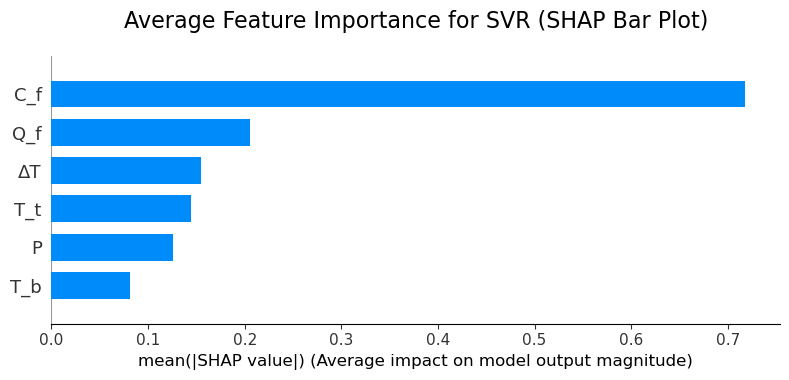

In [ ]:

# 4.2 特征重要性排序图 (Bar Plot)
print("\n--- 正在绘制图2：平均特征重要性图 (Bar Plot) ---")
print("该图更直观地展示了各特征对预测的平均影响大小。")
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X, plot_type="bar", show=False)
plt.title('Average Feature Importance for SVR (SHAP Bar Plot)', fontsize=16, pad=20)
plt.xlabel("mean(|SHAP value|) (Average impact on model output magnitude)", fontsize=12)
plt.tight_layout()
plt.savefig("E:/20250515-优化工艺参数-代码和数据/画图/shap_bar_plot_y1.", format="webp", dpi=300)
plt.show()

#eps, jpeg, jpg, pdf, pgf, png, ps, raw, rgba, svg, svgz, tif, tiff, webp

In [6]:

raw_shap_values = shap_values
feature_columns = X.columns if isinstance(X, pd.DataFrame) else feature_names
mean_abs_shap = np.abs(raw_shap_values).mean(axis=0)
importance_df = pd.DataFrame({
    'Feature': feature_columns,
    'Mean_Absolute_SHAP_Value': mean_abs_shap
})
importance_df = importance_df.sort_values(
    by='Mean_Absolute_SHAP_Value', 
    ascending=False
).reset_index(drop=True)
print("特征重要性排序图 (Bar Plot) 的数据：")
print(importance_df.head(6).to_string(index=True, float_format=lambda x: f"{x:.4f}"))

特征重要性排序图 (Bar Plot) 的数据：
  Feature  Mean_Absolute_SHAP_Value
0     C_f                    0.7182
1     Q_f                    0.2052
2      ΔT                    0.1547
3     T_t                    0.1440
4       P                    0.1259
5     T_b                    0.0808



--- 正在绘制图3：各特征的依赖图 (Dependence Plots) ---
该系列图展示了单个特征如何具体影响模型的输出，并能揭示交互效应。


<Figure size 1200x800 with 0 Axes>

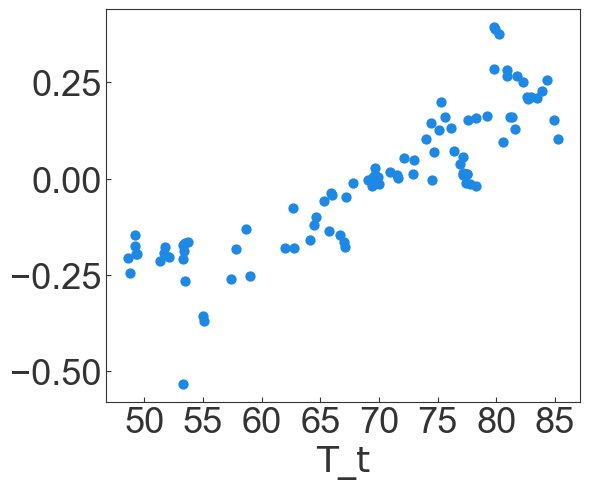

<Figure size 1200x800 with 0 Axes>

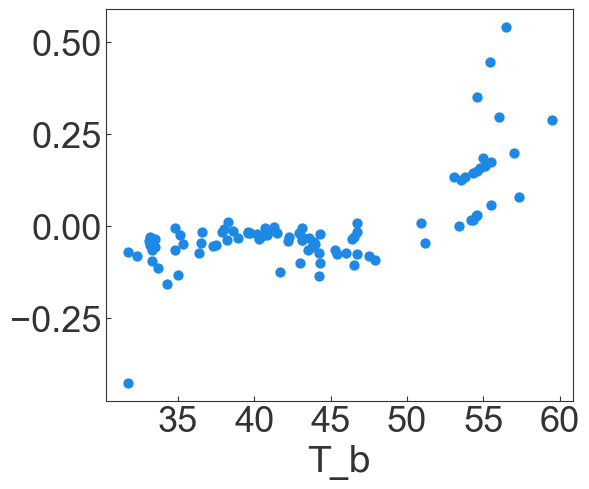

<Figure size 1200x800 with 0 Axes>

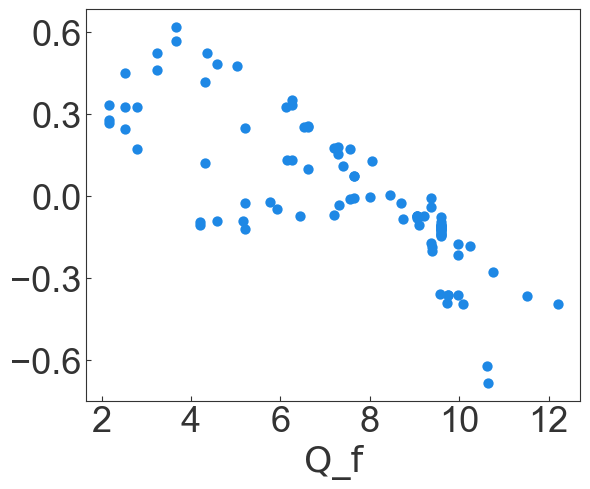

<Figure size 1200x800 with 0 Axes>

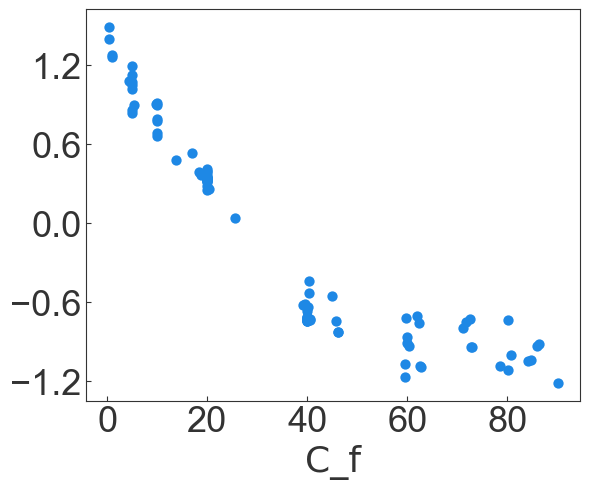

<Figure size 1200x800 with 0 Axes>

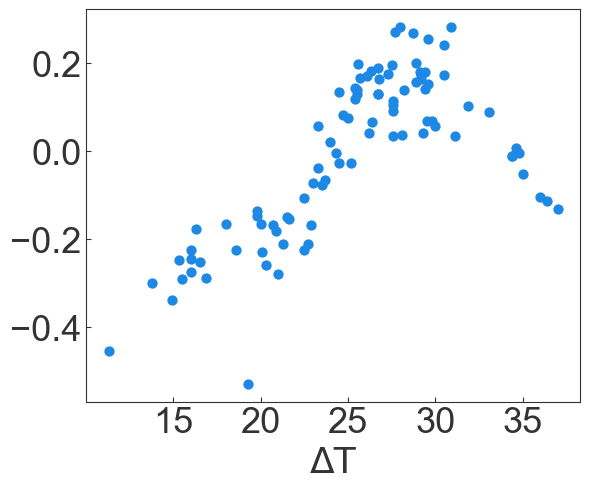

<Figure size 1200x800 with 0 Axes>

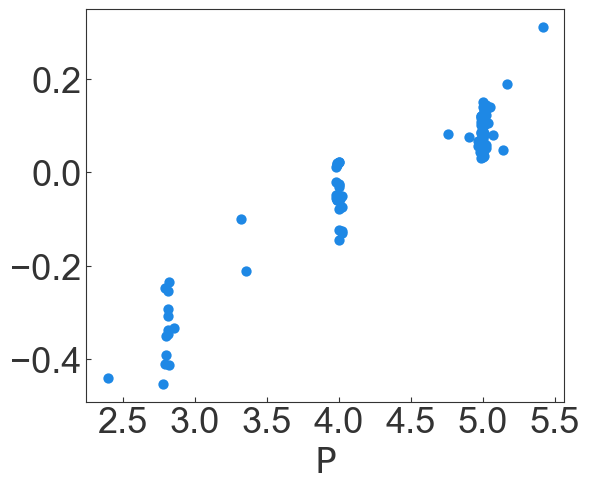

📊 总样本数量 (散点个数): 93 个


In [69]:
from matplotlib.ticker import MaxNLocator

# 4.3 特征依赖图 (Dependence Plots)
print("\n--- 正在绘制图3：各特征的依赖图 (Dependence Plots) ---")
print("该系列图展示了单个特征如何具体影响模型的输出，并能揭示交互效应。")
for feature in feature_names:
    plt.figure(figsize=(12, 8)) # 为每个依赖图创建一个新的图形窗口
    shap.dependence_plot(
        feature, 
        shap_values, 
        X, 
        interaction_index=None,
        dot_size=55,             
        show=False
    )
    
    ax = plt.gca()
    ax.yaxis.set_major_locator(MaxNLocator(nbins=5, prune='both'))
    ax.spines['right'].set_visible(True)
    ax.spines['top'].set_visible(True)
    ax.tick_params(
        axis='y',          # 针对 Y 轴（即左轴）
        direction='in'     # 设置刻度线方向朝内
	)
    ax.tick_params(
        axis='x',
        labeltop=False,
        direction='in'     
    )
    plt.ylabel(f"", fontsize=26)
    plt.xlabel(f"{feature}", fontsize=26)
    plt.yticks(fontsize=26, fontfamily='Arial')
    plt.xticks(fontsize=26, fontfamily='Arial')
    plt.tight_layout()
    plt.grid(False)
    plt.savefig(f"E:/20250515-优化工艺参数-代码和数据/画图/SI/209shap_dependence_y1_{feature}.tiff", format="tiff", dpi=300)
    plt.show()


total_points = len(X)
print(f"📊 总样本数量 (散点个数): {total_points} 个")


--- 正在绘制图4：双变量部分依赖图 (2D Contour Plots) ---

正在计算和绘制 'T_t' 与 'T_b' 的交互图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

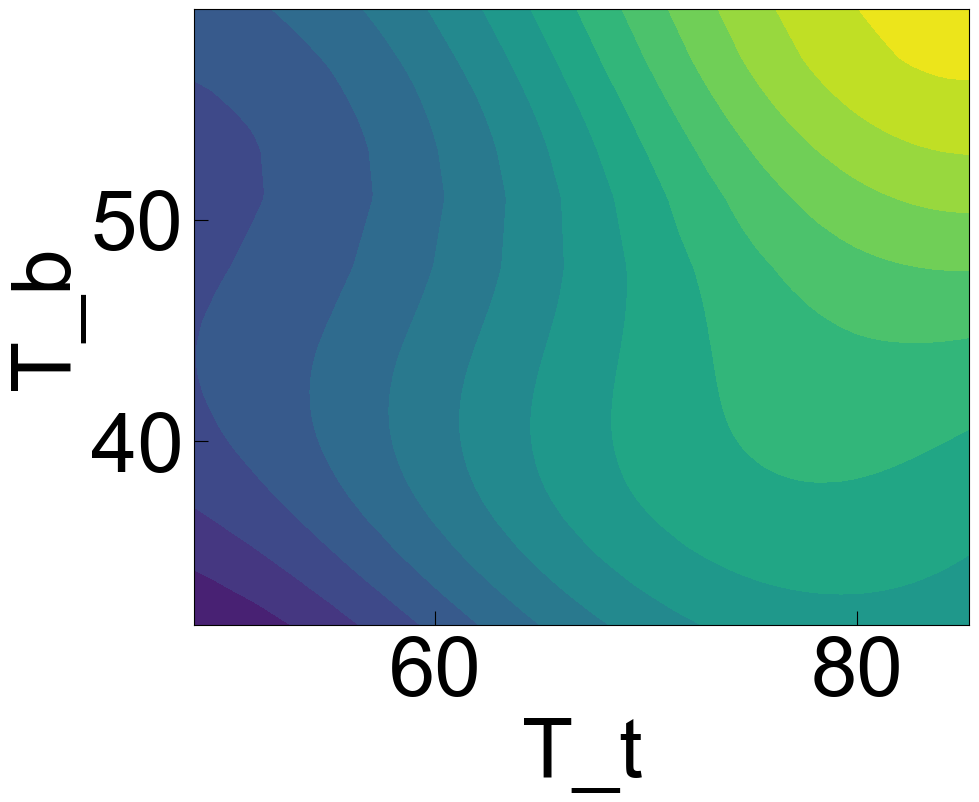


正在计算和绘制 'T_t' 与 'Q_f' 的交互图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

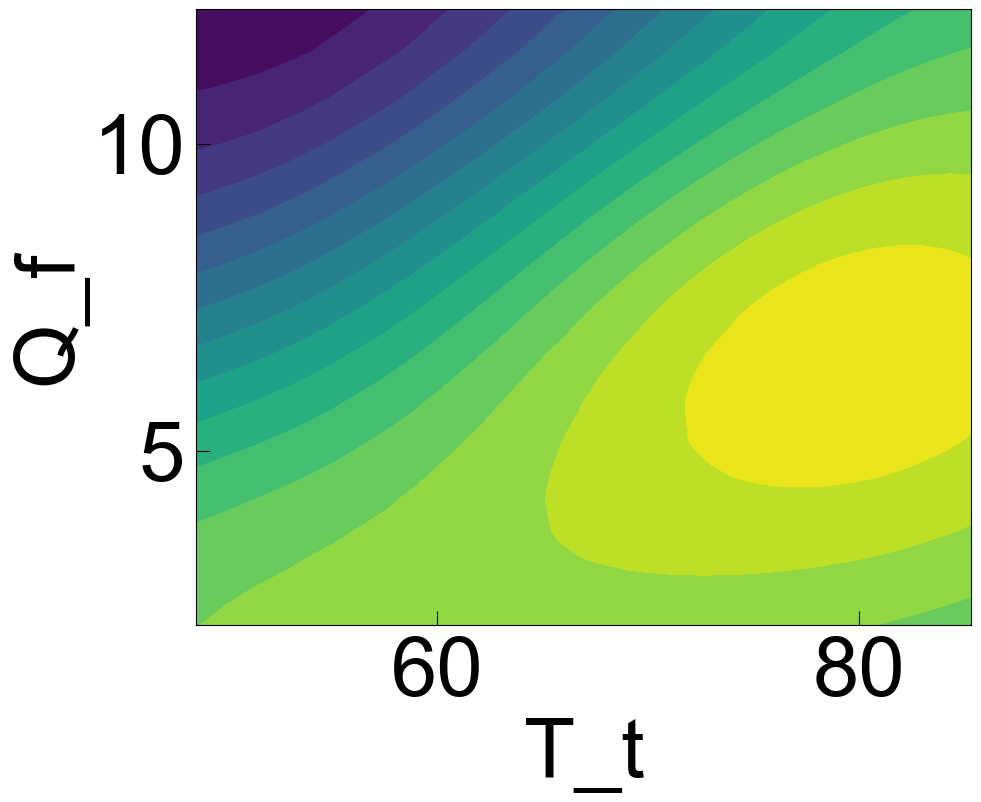


正在计算和绘制 'T_t' 与 'C_f' 的交互图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

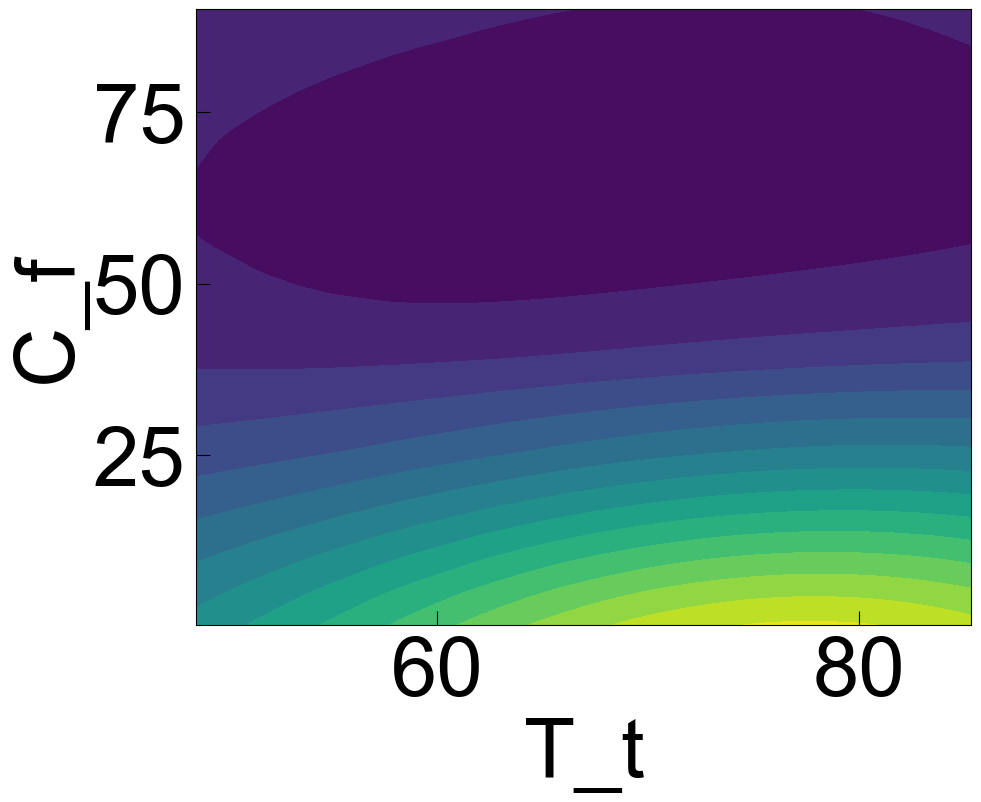


正在计算和绘制 'T_t' 与 'ΔT' 的交互图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

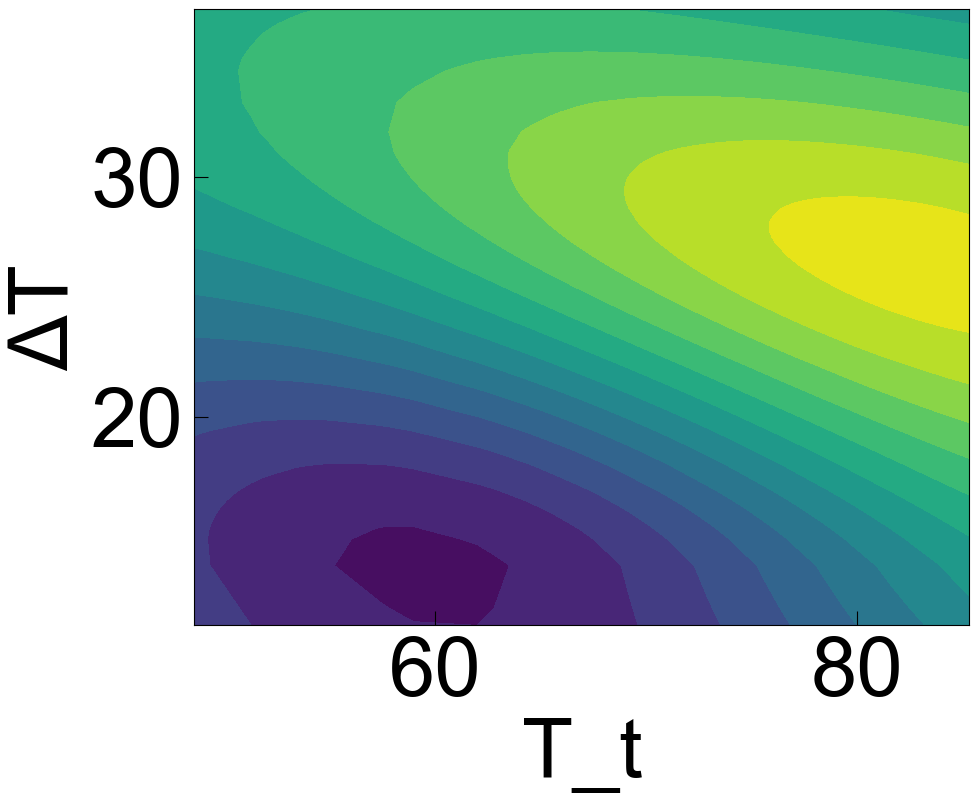


正在计算和绘制 'T_t' 与 'P' 的交互图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

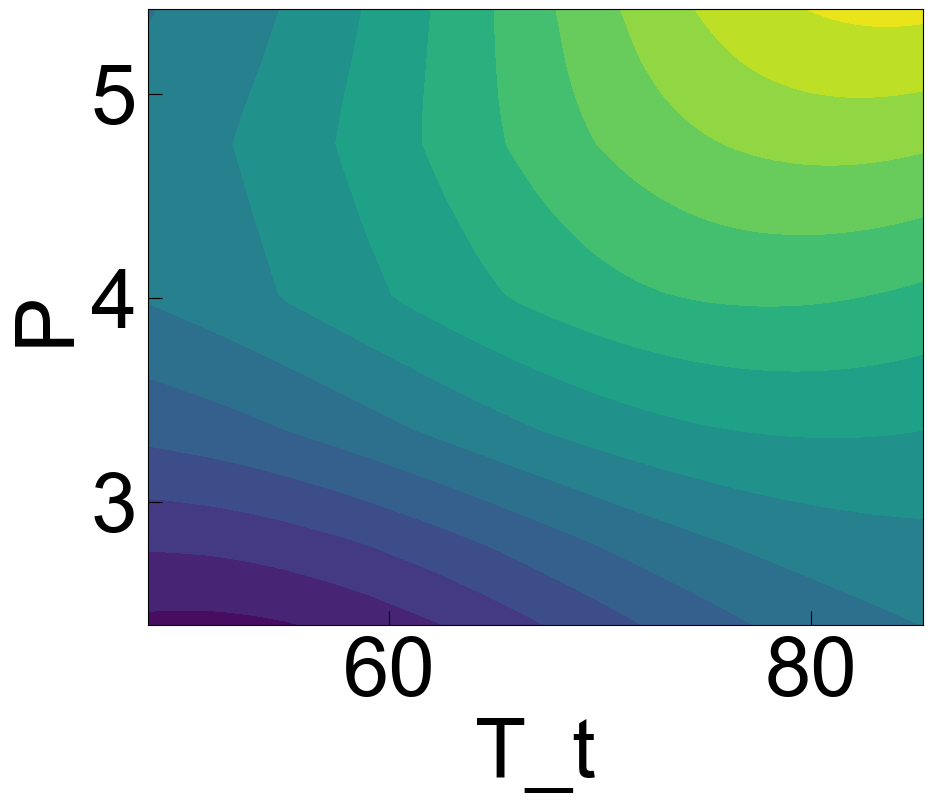


正在计算和绘制 'T_b' 与 'Q_f' 的交互图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

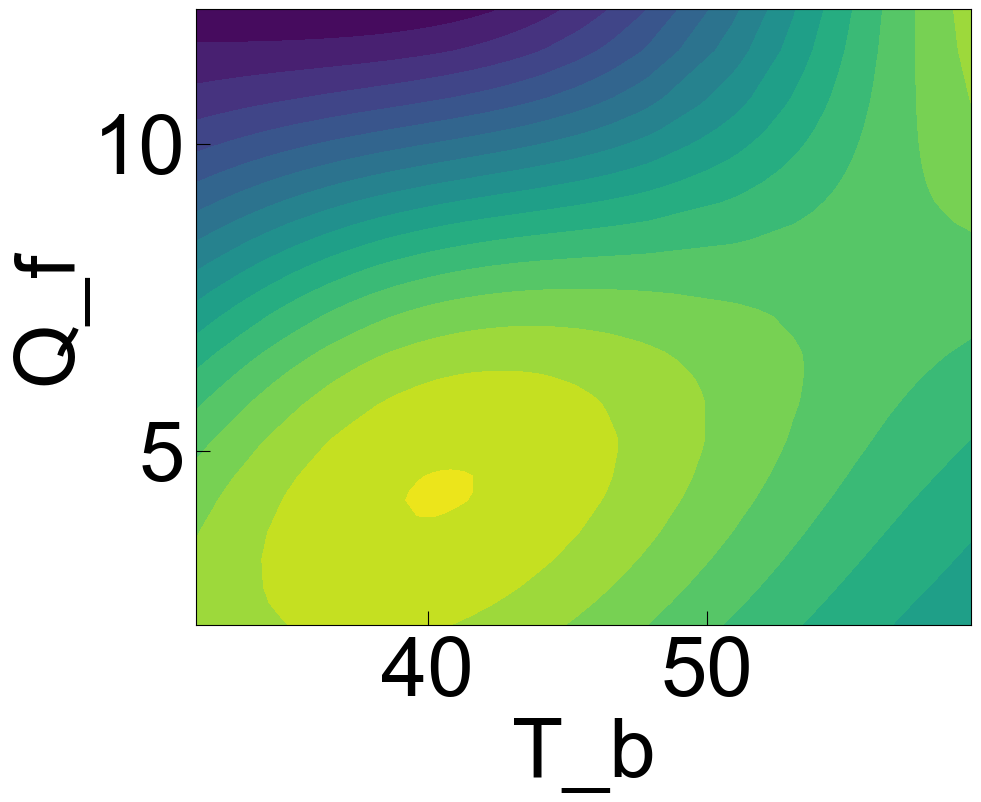


正在计算和绘制 'T_b' 与 'C_f' 的交互图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

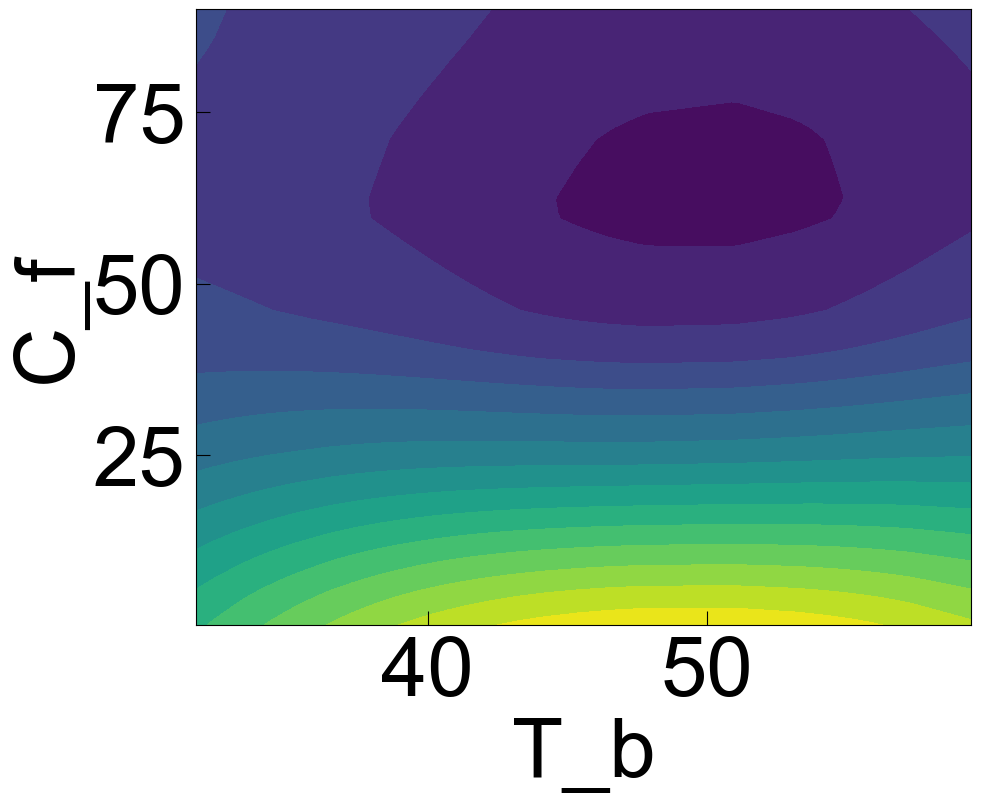

e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe


正在计算和绘制 'T_b' 与 'ΔT' 的交互图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

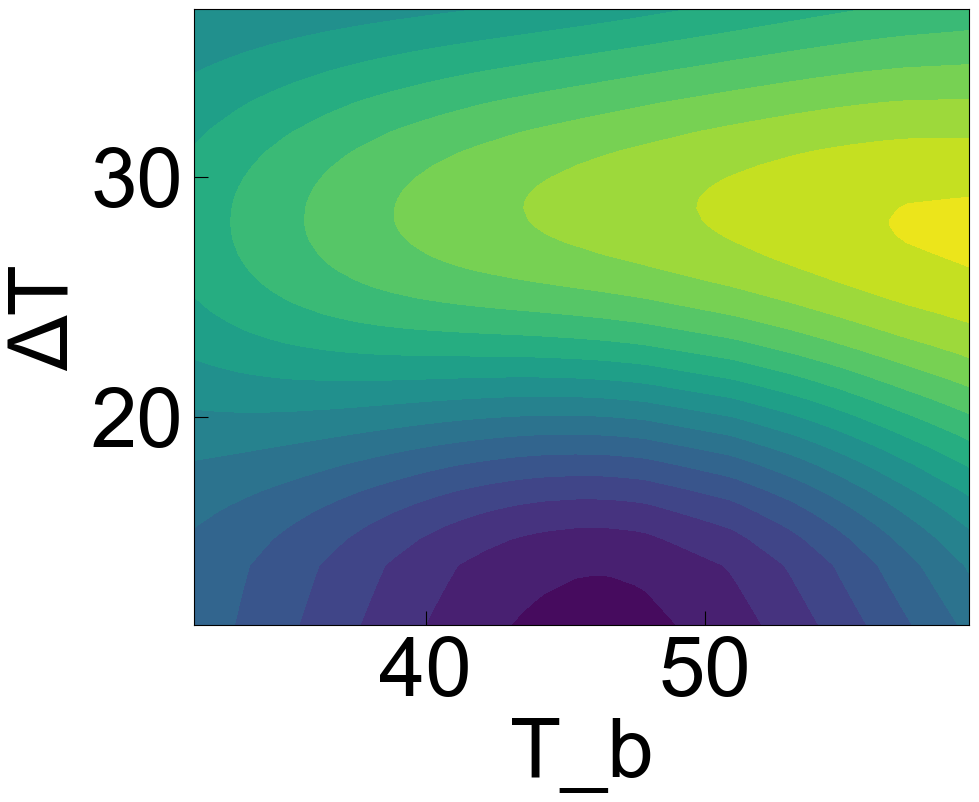


正在计算和绘制 'T_b' 与 'P' 的交互图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

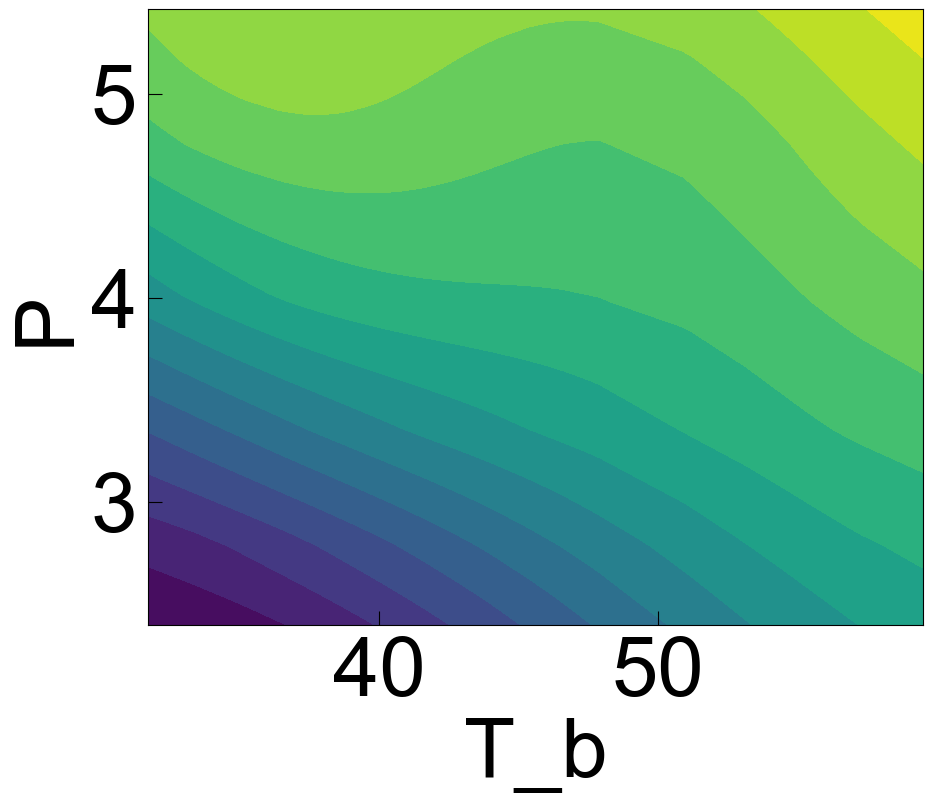


正在计算和绘制 'Q_f' 与 'C_f' 的交互图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

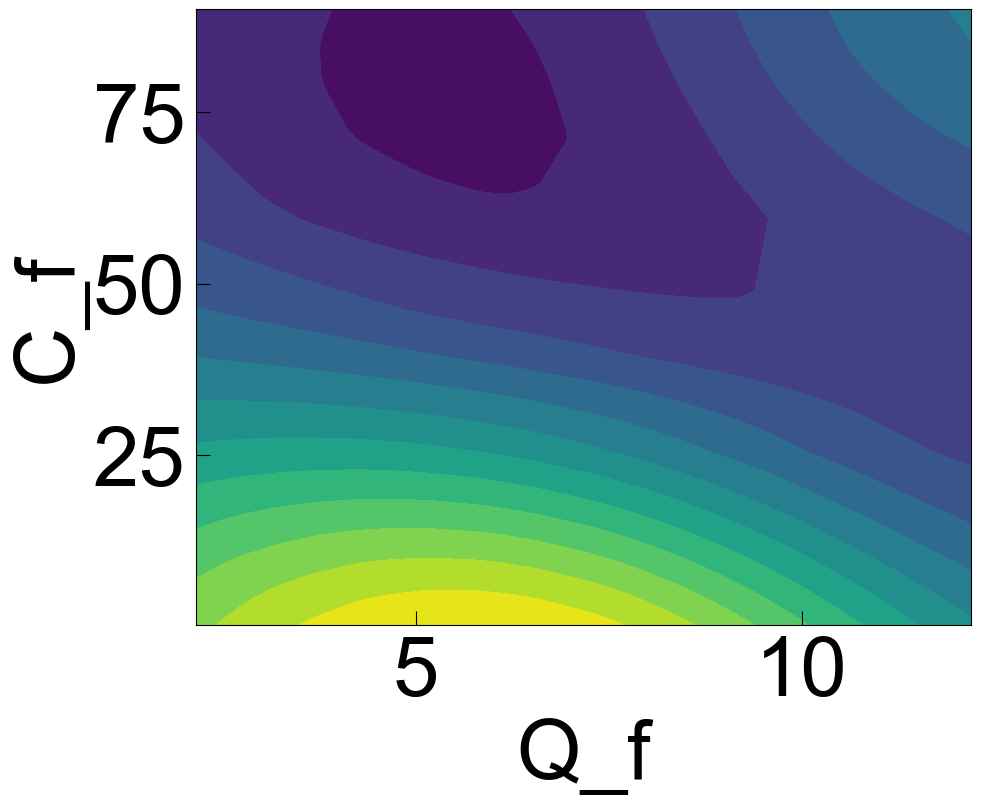

e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe


正在计算和绘制 'Q_f' 与 'ΔT' 的交互图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

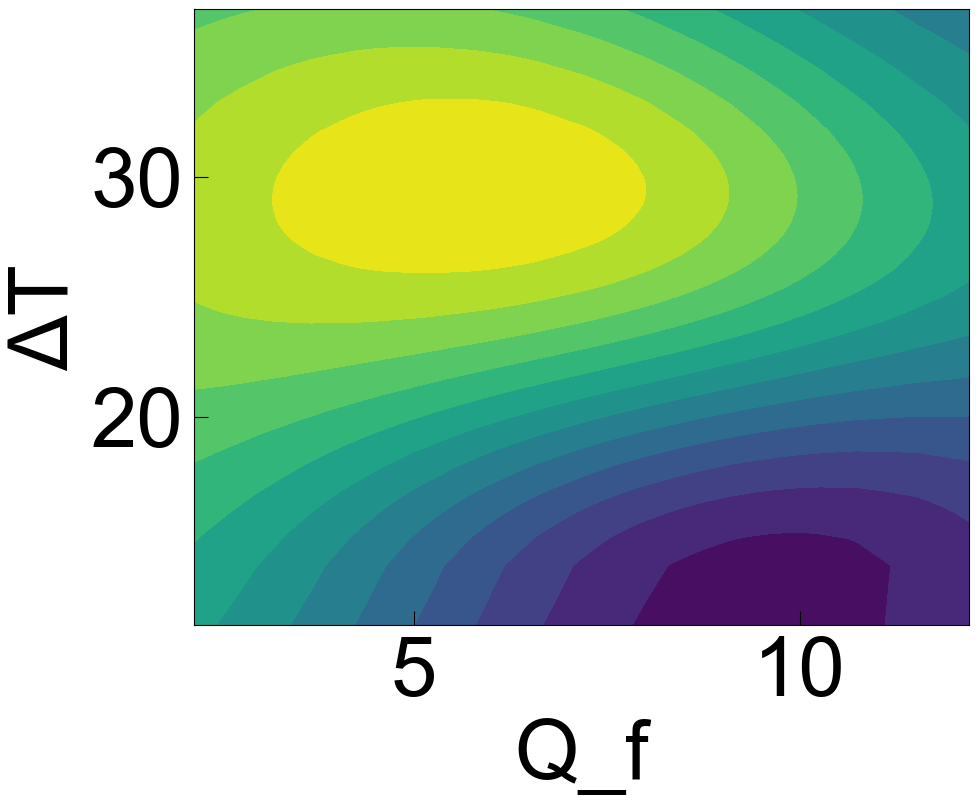

e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe


正在计算和绘制 'Q_f' 与 'P' 的交互图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

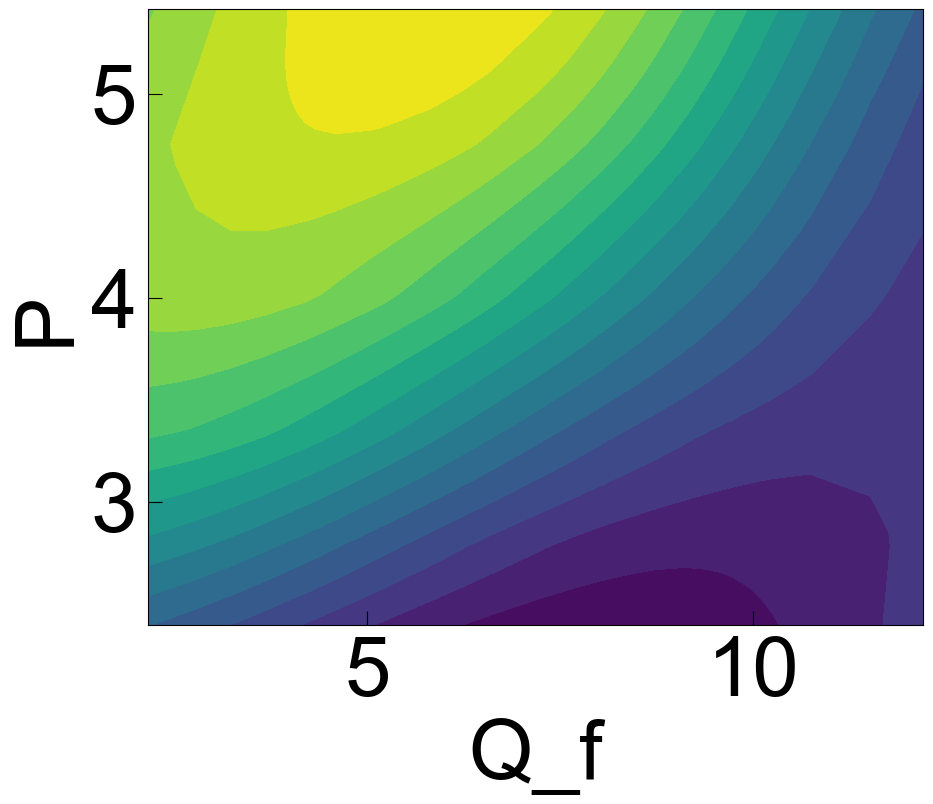

e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe


正在计算和绘制 'C_f' 与 'ΔT' 的交互图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

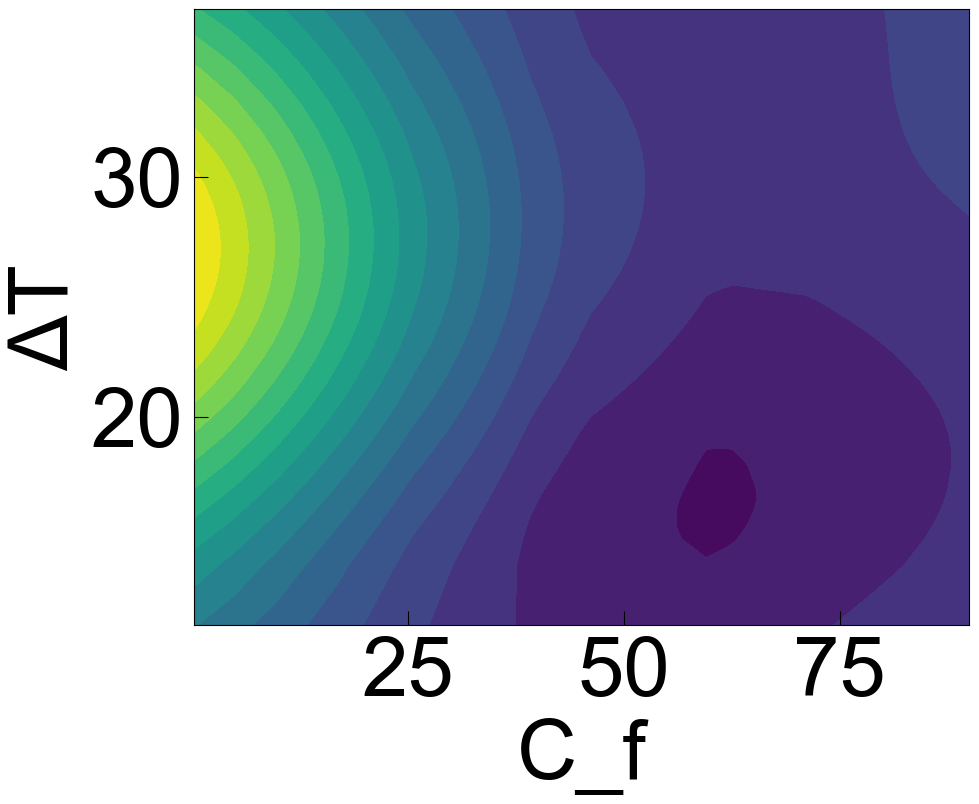


正在计算和绘制 'C_f' 与 'P' 的交互图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

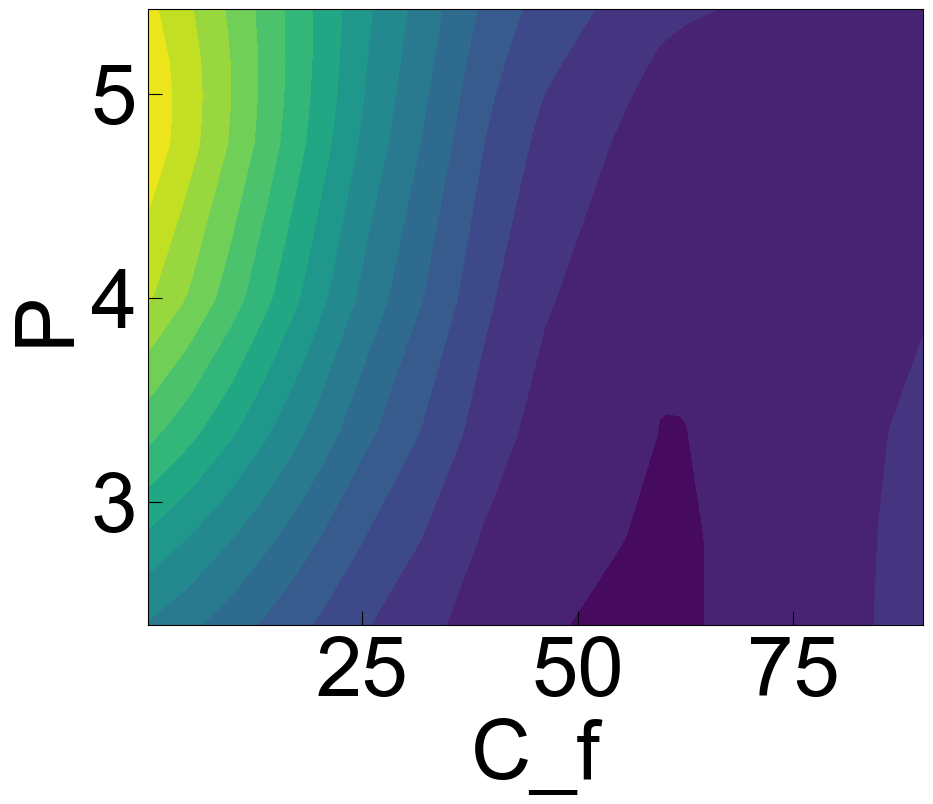


正在计算和绘制 'ΔT' 与 'P' 的交互图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

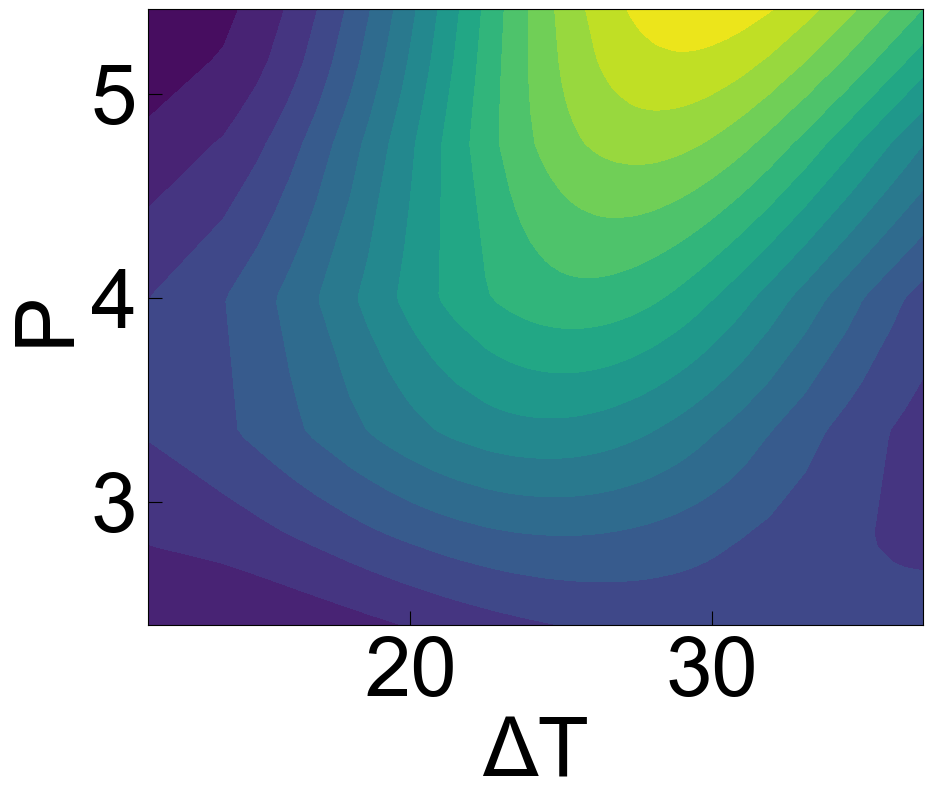

In [13]:
# --- 5. 绘制双变量部分依赖图 (Bivariate Partial Dependence Plots) ---
print("\n--- 正在绘制图4：双变量部分依赖图 (2D Contour Plots) ---")
from sklearn.inspection import partial_dependence
# 生成所有特征的两两组合
feature_pairs = list(combinations(feature_names, 2))


# 遍历每个特征对
for pair in feature_pairs:
    feature1, feature2 = pair
    print(f"\n正在计算和绘制 '{feature1}' 与 '{feature2}' 的交互图...")
    
    # 使用 partial_dependence 函数计算 PDP 数据
    # 我们在标准化的训练集上进行计算，因为模型是在此基础上训练的
    pdp_results = partial_dependence(
        best_model,
        X_scaled_df, # 使用DataFrame以支持字符串特征名
        features=[feature1, feature2],
        kind='average',
        grid_resolution=400 # 增加网格密度以获得更平滑的等高线
    )

    # 提取计算结果
    Z_scaled = pdp_results['average'][0]
    grid_values = pdp_results['grid_values']
    
    # 将预测结果Z反标准化到原始尺度
    Z_orig = y_scaler.inverse_transform(Z_scaled.reshape(-1, 1)).reshape(Z_scaled.shape)
    
    # 创建二维网格用于反标准化坐标轴
    XX, YY = np.meshgrid(grid_values[0], grid_values[1])
    grid_nodes_scaled = np.c_[XX.ravel(), YY.ravel()]
    
    # 反标准化坐标轴的技巧
    background_board = np.tile(x_scaler.mean_, (grid_nodes_scaled.shape[0], 1))
    f1_idx = feature_names.index(feature1)
    f2_idx = feature_names.index(feature2)
    background_board[:, f1_idx] = grid_nodes_scaled[:, 0]
    background_board[:, f2_idx] = grid_nodes_scaled[:, 1]
    grid_nodes_orig = x_scaler.inverse_transform(background_board)
    
    # 提取反标准化后的坐标轴
    X_axis = grid_nodes_orig[:, f1_idx].reshape(XX.shape)
    Y_axis = grid_nodes_orig[:, f2_idx].reshape(YY.shape)
    
    # --- 【修改】使用 Matplotlib 创建 2D 等高线图 ---
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # 绘制填充等高线 (contourf)，20个水平层级
    contour = ax.contourf(X_axis, Y_axis, Z_orig.T, 15, cmap='viridis')
 
    # 添加颜色条，显示预测的PR值
    #cbar = fig.colorbar(contour, ax=ax, label='Predicted PR')
    #cbar.set_label('Predicted PR Value', fontsize=22, fontfamily='Arial') 
    
    # 修改颜色条刻度 (tick) 数字的字体大小
    #cbar.ax.tick_params(labelsize=16)
    
    # 绘制等高线线条 (contour)
    #contour_lines = ax.contour(X_axis, Y_axis, Z_orig.T, 15, linewidths=0.5)
    
    # 在等高线上添加数值标签
    #ax.clabel(contour_lines, inline=False, fontsize=12, fmt='%.2f')
    
    # 在图上叠加实际训练数据点的散点图，以显示数据分布
    # 只绘制与当前特征对相关的两列数据
    #ax.scatter(X_train[feature1], X_train[feature2], c='red', s=10, alpha=0.5, label='Training Data Points')
    
    # 设置刻度标签字体
    ax.tick_params(axis='both', which='major', direction='in', length=10, labelsize=60, pad=8)
    for label in ax.get_xticklabels():
        label.set_fontfamily('Arial')
    for label in ax.get_yticklabels():
        label.set_fontfamily('Arial')
    
    # 设置图表标题和坐标轴标签
    file_name = f"E:/20250515-优化工艺参数-代码和数据/画图/SI/PDP_y1_{feature1}_{feature2}.pdf"
    #ax.set_title(f'Partial Dependence: {feature1} & {feature2}', fontsize=22, pad=20)
    ax.set_xlabel(feature1, fontfamily='Arial', fontsize=60)
    ax.set_ylabel(feature2, fontsize=60, fontfamily='Arial')
    plt.savefig(file_name, format="pdf", dpi=1200, bbox_inches='tight')
    plt.show()




--- 正在绘制图5：个体条件期望图 (ICE Plots) ---
该图展示了单个样本的预测值随特征变化的情况，揭示个体层面的特征影响。
注意：计算过程可能需要几分钟，请耐心等待...

正在绘制特征 'T_t' 的ICE图...
正在绘制特征 'T_t' 的中心化ICE图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

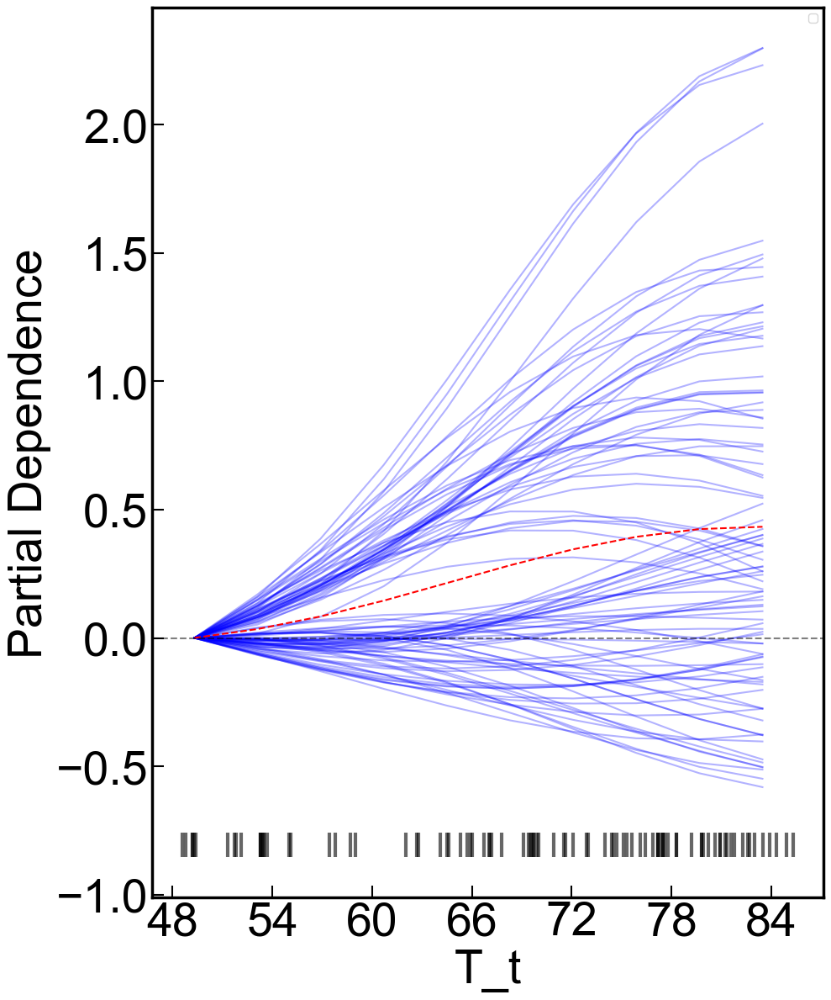


正在绘制特征 'T_b' 的ICE图...
正在绘制特征 'T_b' 的中心化ICE图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

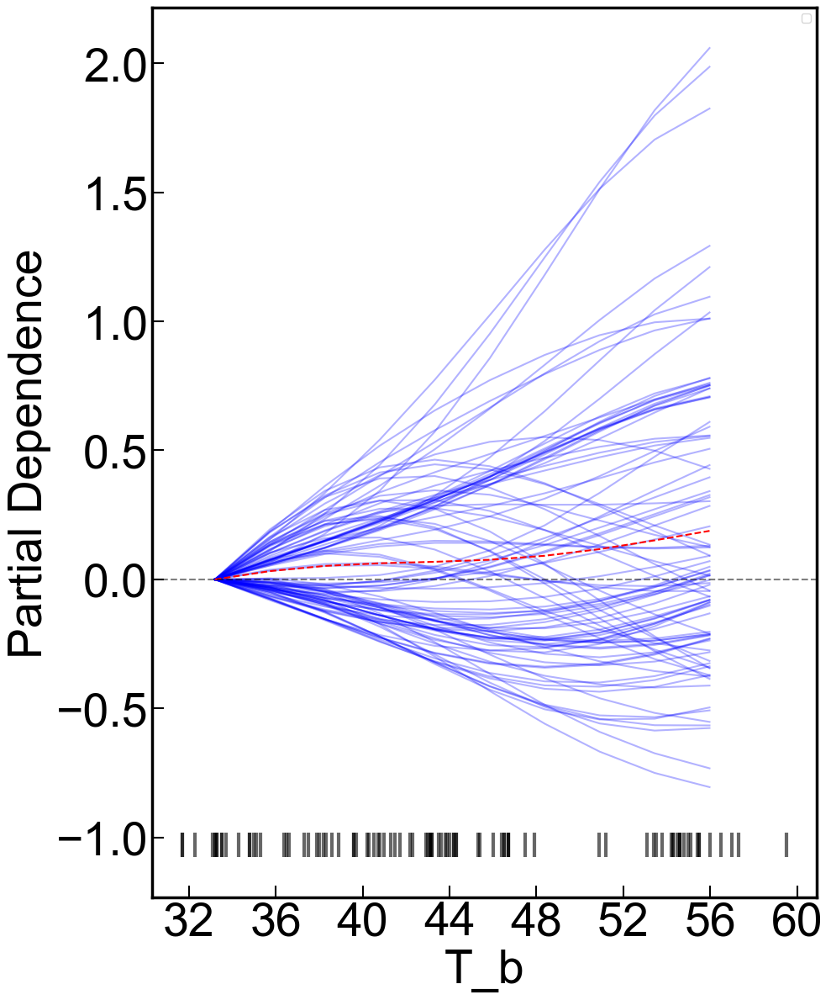


正在绘制特征 'Q_f' 的ICE图...
正在绘制特征 'Q_f' 的中心化ICE图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

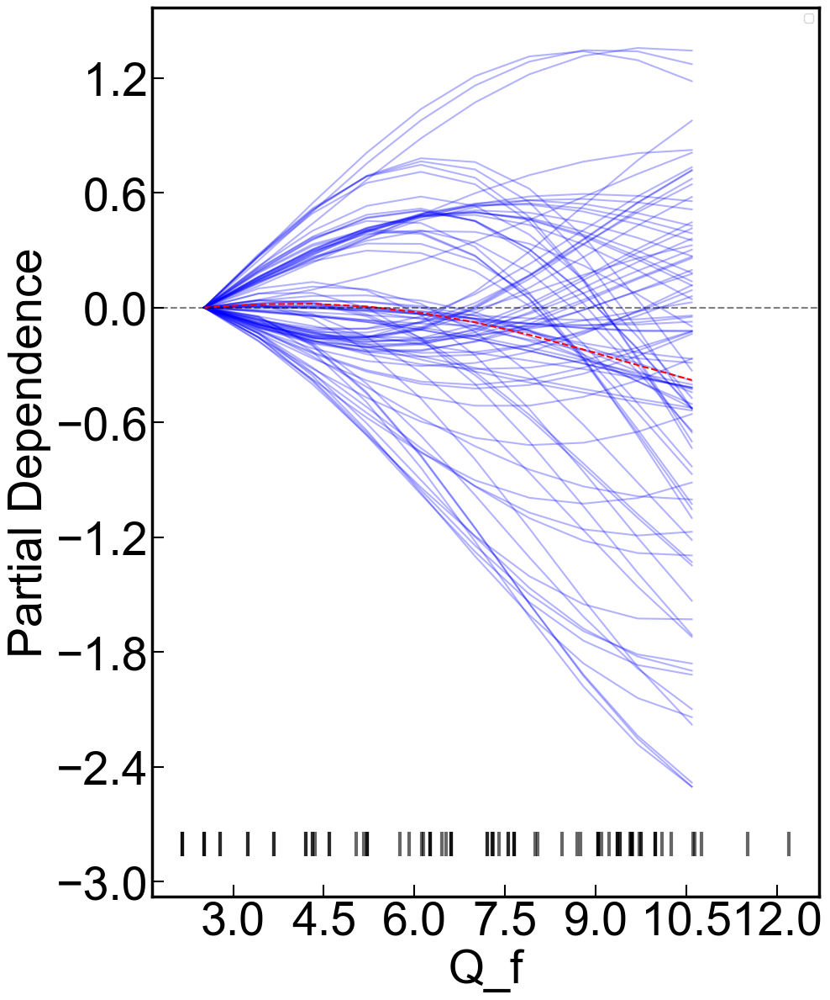


正在绘制特征 'C_f' 的ICE图...
正在绘制特征 'C_f' 的中心化ICE图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

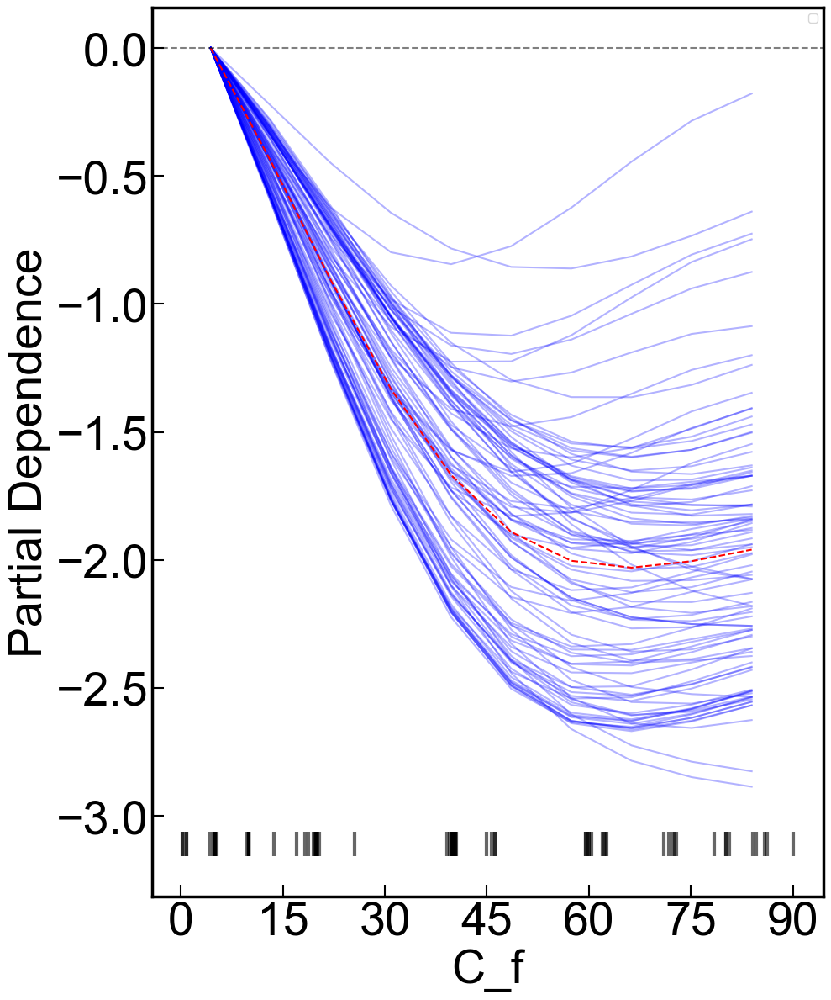


正在绘制特征 'ΔT' 的ICE图...
正在绘制特征 'ΔT' 的中心化ICE图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

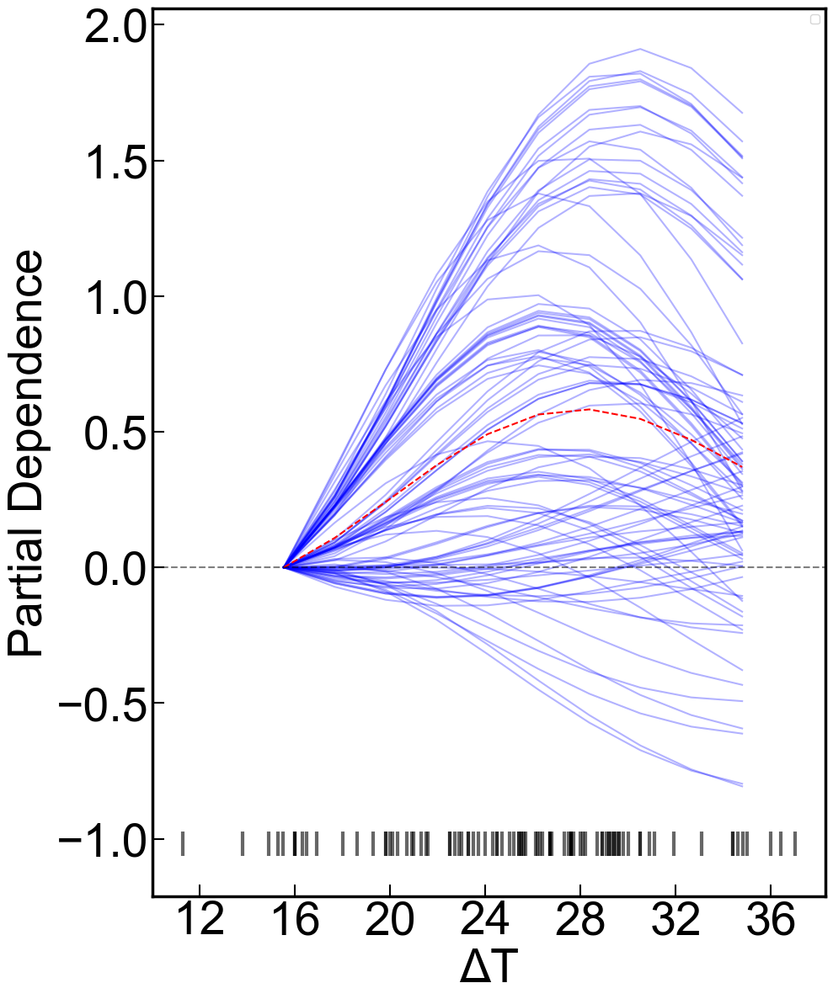


正在绘制特征 'P' 的ICE图...
正在绘制特征 'P' 的中心化ICE图...


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without fe

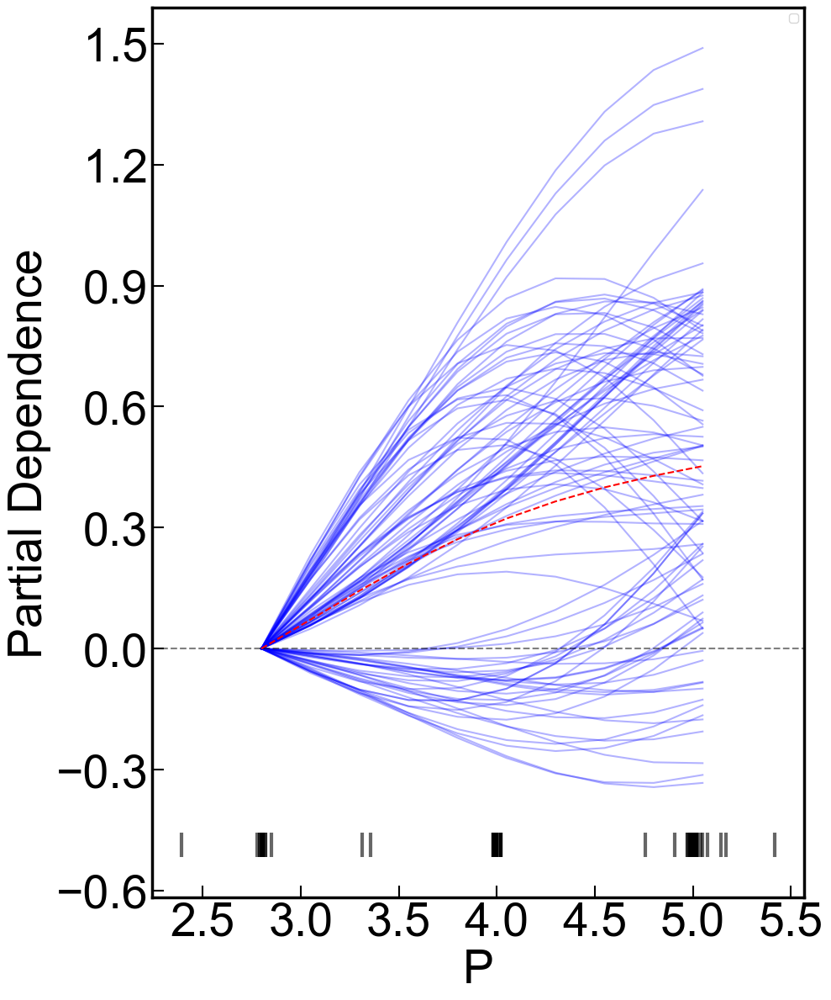

In [11]:
# --- 6. 绘制个体条件期望图 (Individual Conditional Expectation Plots) ---
print("\n--- 正在绘制图5：个体条件期望图 (ICE Plots) ---")
print("该图展示了单个样本的预测值随特征变化的情况，揭示个体层面的特征影响。")
print("注意：计算过程可能需要几分钟，请耐心等待...")

from sklearn.inspection import partial_dependence
from matplotlib.ticker import MaxNLocator
# 设置参数
n_ice_lines = 100  # 要绘制的ICE曲线数量（避免过于拥挤）
grid_resolution = 10  # 网格分辨率

# 遍历每个特征绘制ICE图
for feature in feature_names:
    print(f"\n正在绘制特征 '{feature}' 的ICE图...")
    
    # 使用 partial_dependence 计算ICE数据
    ice_results = partial_dependence(
        best_model,
        X_scaled_df,
        features=[feature],
        kind='individual',  # 使用'individual'而不是'average'来获取个体曲线
        grid_resolution=grid_resolution
    )
    
    # 提取计算结果
    ice_values_scaled = ice_results['individual'][0]  # 形状: (n_samples, grid_resolution)
    grid_values_scaled = ice_results['grid_values'][0]  # 形状: (grid_resolution,)
    
    # --- 将坐标轴反标准化到原始尺度 ---
    # 创建用于反标准化的背景板
    background_mean = x_scaler.mean_.copy()
    feature_idx = feature_names.index(feature)
    
    # 为每个网格点创建完整的特征向量
    grid_points_orig = []
    for grid_val in grid_values_scaled:
        feature_vector = background_mean.copy()
        feature_vector[feature_idx] = grid_val
        grid_points_orig.append(feature_vector)
    
    grid_points_orig = np.array(grid_points_orig)
    
    # 反标准化特征值
    grid_values_orig = x_scaler.inverse_transform(grid_points_orig)[:, feature_idx]
    
    # --- 将预测值反标准化到原始尺度 ---
    ice_values_orig = y_scaler.inverse_transform(ice_values_scaled.reshape(-1, 1)).reshape(ice_values_scaled.shape)
    
    # --- 随机选择部分样本绘制ICE曲线，避免过于拥挤 ---
    n_samples = ice_values_orig.shape[0]
    ice_selected = ice_values_orig
    selected_indices = np.arange(n_samples)
    
    # --- 计算平均PDP曲线 ---
    pdp_curve = np.mean(ice_values_orig, axis=0)

    # 在原始数据点位置添加标记
    original_feature_values = X.iloc[selected_indices][feature].values
    corresponding_predictions = []
    
    for idx in selected_indices:
        # 找到最接近的网格点对应的预测值
        actual_value = X.iloc[idx][feature]
        closest_grid_idx = np.argmin(np.abs(grid_values_orig - actual_value))
        pred_value = ice_values_orig[idx, closest_grid_idx]
        corresponding_predictions.append(pred_value)

    
    # --- 可选：绘制中心化ICE图，更好地观察个体差异 ---
    print(f"正在绘制特征 '{feature}' 的中心化ICE图...")
    
    fig, ax = plt.subplots(figsize=(10, 12))
    
    # 计算中心化ICE曲线（以每个曲线在第一个点的值为基准）
    ice_centered = ice_selected - ice_selected[:, 0:1]
    
    # 绘制中心化ICE曲线
    for i in range(ice_centered.shape[0]):
        ax.plot(grid_values_orig, ice_centered[i], 
               color='blue', alpha=0.3, linewidth=1.5)
    
    # 绘制中心化平均曲线
    pdp_centered = np.mean(ice_centered, axis=0)
    ax.plot(grid_values_orig, pdp_centered, 
           color='red', linewidth=1.5, linestyle='--')
    # --- 新增：添加入场图 (Rug Plot) ---
# --- 新增：添加入场图 (Rug Plot) ---
# 获取当前Y轴范围
    ymin, ymax = ax.get_ylim()

# --- 修改：计算 Rug Plot 在绘图框外的Y坐标 ---
# 1. 定义 rug 的高度（例如，Y轴范围的3%）
    rug_height = (ymax - ymin) * 0.03 
# 2. 定义 rug 顶部距离绘图框底部的“间隙”
    padding = (ymax - ymin) * 0.01 
# 3. 计算 rug 的顶部和底部
    rug_y_top = ymin - padding
    rug_y_bottom = rug_y_top - rug_height
# 4. 绘制 vlines，并设置 clip_on=False
#    (确保 original_feature_values 已经定义)
    ax.vlines(x=original_feature_values, 
            ymin=rug_y_bottom, 
            ymax=rug_y_top, # <--- 起始点(顶部)在 ymin 之下
            color='black', 
            linewidth=3,
            alpha=0.6,
            clip_on=False) # <--- 【关键】允许在框外绘图

# --- 核心修改 1：修改边框粗细 (Spine Linewidth) ---
    border_width = 2.5  # 你可以根据需要调整这个数值
    for spine in ax.spines.values():
        spine.set_linewidth(border_width)




# --- 新增：调整主刻度密度 ---
    ax.xaxis.set_major_locator(MaxNLocator(nbins=8)) 
    ax.yaxis.set_major_locator(MaxNLocator(nbins=8)) 

# ... (ax.set_xlabel, ax.set_ylabel 等设置) ...
    ax.set_xlabel(f'{feature}', fontsize=40, fontfamily='Arial')
    ax.set_ylabel('Partial Dependence', fontsize=40, fontfamily='Arial')
    
    # 设置刻度标签字体
    ax.tick_params(axis='both', which='major', direction='in', length=10,  width=1.5, labelsize=40)
    for label in ax.get_xticklabels():
        label.set_fontfamily('Arial')
    for label in ax.get_yticklabels():
        label.set_fontfamily('Arial')
    
    # 设置图例字体
    legend = ax.legend()
    ax.grid(False)
    ax.axhline(y=0, color='black', linestyle='--', alpha=0.5)    
    plt.tight_layout()
    plt.savefig(f"E:/20250515-优化工艺参数-代码和数据/画图/SI/ice_plot_y1{feature}.pdf", format="pdf", dpi=300)
    plt.show()


In [72]:
# --- 6. 将所有模型性能结果保存至Excel ---
print(f"\n{'='*25} 生成性能报告 {'='*25}")

# 导入pandas库，它是处理表格数据的核心工具
import pandas as pd

# 检查 model_performance_results 是否有内容
if model_performance_results:
    # 1. 将存储结果的字典转换为pandas DataFrame
    # orient='index' 会让字典的键（模型名称）成为DataFrame的行索引
    performance_df = pd.DataFrame.from_dict(model_performance_results, orient='index')

    # 2. 调整列的顺序，使其更符合报告的阅读习惯
    # 与您提供的图片格式保持一致
    column_order = [
        'train_r2', 'test_r2', 
        'train_rmse', 'test_rmse', 
        'train_mae', 'test_mae'
    ]
    performance_df = performance_df[column_order]

    # 3. (可选，但建议) 重命名列名，使其更具可读性
    performance_df.rename(columns={
        'train_r2': 'R² (Train)', 'test_r2': 'R² (Test)',
        'train_rmse': 'RMSE (Train)', 'test_rmse': 'RMSE (Test)',
        'train_mae': 'MAE (Train)', 'test_mae': 'MAE (Test)'
    }, inplace=True)

    # 4. (可选，但建议) 为行索引命名
    performance_df.index.name = 'Best Model'

    # 5. 定义要保存的Excel文件名
    output_filename = '11111.xlsx'

    # 6. 将DataFrame保存为Excel文件
    # index=True确保模型名称（行索引）也被写入文件
    performance_df.to_excel(output_filename, index=True)

    print(f"所有模型的性能对比已成功保存至Excel文件: '{output_filename}'")
    
    # 打印最终的DataFrame，以便在控制台预览
    print("\n--- 性能对比总表 ---")
    print(performance_df)

else:
    print("没有可供保存的性能结果。")


========================= 生成性能报告 =========================
所有模型的性能对比已成功保存至Excel文件: '11111.xlsx'

--- 性能对比总表 ---
              R² (Train)  R² (Test)  RMSE (Train)  RMSE (Test)  MAE (Train)  \
Best Model                                                                    
Ridge           0.699468   0.794543      0.451516     0.337727     0.355630   
DecisionTree    0.823309   0.833927      0.346207     0.303638     0.243354   
RandomForest    0.923811   0.908519      0.227338     0.225357     0.162680   
ExtraTrees      0.921616   0.882326      0.230590     0.255591     0.156136   
SVR             0.895119   0.929560      0.266733     0.197750     0.157358   
XGBoost         0.966659   0.916981      0.150390     0.214681     0.109293   
LightGBM        0.775567   0.867442      0.390186     0.271275     0.270935   
CatBoost        0.981540   0.884516      0.111904     0.253202     0.086009   
MLP             0.681839   0.779374      0.464571     0.349973     0.353070   

              MAE

In [ ]:
# --- 6. 绘制个体条件期望图 (Individual Conditional Expectation Plots) ---
from sklearn.inspection import partial_dependence
from matplotlib.ticker import MaxNLocator
import matplotlib.pyplot as plt
import numpy as np

# 设置全局字体（确保 Arial 生效）
plt.rcParams['font.sans-serif'] = ['Arial']
plt.rcParams['axes.unicode_minus'] = False

# 遍历每个特征绘制ICE图
for feature in feature_names:
    # ... [此处省略前面的计算逻辑：ice_results, inverse_transform 等] ...
    
    # 创建画布
    fig, ax = plt.subplots(figsize=(10, 8)) # 调整了一下比例，更适合5个刻度的展示
    
    # 1. 计算并绘制中心化ICE曲线
    ice_centered = ice_selected - ice_selected[:, 0:1]
    for i in range(ice_centered.shape[0]):
        ax.plot(grid_values_orig, ice_centered[i], 
                color='blue', alpha=0.2, linewidth=1, label='Individual' if i == 0 else "")
    
    # 2. 绘制中心化平均曲线 (PDP)
    pdp_centered = np.mean(ice_centered, axis=0)
    ax.plot(grid_values_orig, pdp_centered, 
            color='red', linewidth=3, linestyle='--', label='Average')

    # 3. 绘制 Rug Plot (入场图)
    ymin, ymax = ax.get_ylim()
    rug_height = (ymax - ymin) * 0.03 
    padding = (ymax - ymin) * 0.01 
    ax.vlines(x=original_feature_values, 
              ymin=ymin - padding - rug_height, 
              ymax=ymin - padding, 
              color='black', linewidth=1.5, alpha=0.4, clip_on=False)

    # --- 核心修改：控制刻度数量 ---
    # nbins=4 通常会产生 5 个刻度点（包括首尾）
    ax.xaxis.set_major_locator(MaxNLocator(nbins=4, steps=[1, 2, 5, 10])) 
    ax.yaxis.set_major_locator(MaxNLocator(nbins=6)) # 纵轴可以稍微多一点

    # 4. 设置标签和字体
    ax.set_xlabel(f'{feature}', fontsize=35, fontfamily='Arial', fontweight='bold')
    ax.set_ylabel('$\Delta$ Prediction', fontsize=35, fontfamily='Arial', fontweight='bold')
    
    # 设置刻度外观
    ax.tick_params(axis='both', which='major', direction='in', length=8, width=1.5, labelsize=30)
    
    # 强制刻度使用 Arial
    for label in ax.get_xticklabels():
        label.set_fontfamily('Arial')
    for label in ax.get_yticklabels():
        label.set_fontfamily('Arial')
    
    # 5. 优化图例 (只显示 Individual 和 Average 各一个)
    # ax.legend(prop={'family': 'Arial', 'size': 20}, frameon=False, loc='upper left')
    
    ax.grid(False) # 关闭网格
    ax.axhline(y=0, color='black', linestyle='-', alpha=0.2, linewidth=1) # 零基准线
    
    plt.tight_layout()
    # plt.savefig(f"ice_plot_{feature}.pdf", format="pdf", dpi=300, bbox_inches='tight')
    plt.show()

In [ ]:
 #对训练集和测试集进行预测
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=feature_names)
y1_train_pred = best_model.predict(X_train_scaled_df)  # 使用标准化后的训练集数据
y1_test_pred = best_model.predict(X_test_scaled_df)  # 使用标准化后的测试集数据
y1_test_pred_orig = y_scaler.inverse_transform(y1_test_pred.reshape(-1, 1)).reshape(y1_test_pred.shape)
y1_train_pred_orig = y_scaler.inverse_transform(y1_train_pred.reshape(-1, 1)).reshape(y1_train_pred.shape)
# 输出预测结果的基本信息
print(f"训练集预测完成，预测值范围: {y1_train_pred_orig.min()} 到 {y1_train_pred_orig.max()}")
print(f"测试集预测完成，预测值范围: {y1_test_pred_orig.min()} 到 {y1_test_pred_orig.max()}")

# --- 6. 将预测结果保存到Excel --- 
# 训练集的结果
predictions_df_train = pd.DataFrame({
    'Feature_T_t': X_train['T_t'],
    'Feature_T_b': X_train['T_b'],
    'Feature_Q_f': X_train['Q_f'],
    'Feature_C_f': X_train['C_f'],
    'Feature_ΔT': X_train['ΔT'],
    'Feature_P': X_train['P'],
    'True_PR_Train': y_train.values.flatten(),
    'Predicted_PR_Train': y1_train_pred_orig
})

# 测试集的结果
predictions_df_test = pd.DataFrame({
    'Feature_T_t': X_test['T_t'],
    'Feature_T_b': X_test['T_b'],
    'Feature_Q_f': X_test['Q_f'],
    'Feature_C_f': X_test['C_f'],
    'Feature_ΔT': X_test['ΔT'],
    'Feature_P': X_test['P'],
    'True_β_Test': y_test.values.flatten(),
    'Predicted_β_Test': y1_test_pred_orig
})


# 将训练集和测试集的结果合并
predictions_df = pd.concat([predictions_df_train, predictions_df_test], ignore_index=True)

# 设置保存文件的路径
output_file_path = 'E:/基于ML优化工艺参数/predictions_results_y1.xlsx'

# 将数据框存储为Excel文件
try:
    predictions_df.to_excel(output_file_path, index=False)
    print(f"预测结果已成功保存到: {output_file_path}")
except Exception as e:
    print(f"保存Excel文件时出现错误: {e}")

训练集预测完成，预测值范围: 0.8355469847846382 到 3.921681584111063
测试集预测完成，预测值范围: 0.9873557540071454 到 2.8260587085691005
预测结果已成功保存到: E:/基于ML优化工艺参数/predictions_results_y1.xlsx


e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
e:\myenv\myenv3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SVR was fitted without feature names
  warnings.warn(
